In [1088]:
using Pkg
Pkg.activate("..")
# Pkg.instantiate()
# Pkg.precompile()

  Activating project at `~/julia/ViscousStreaming.jl`


In [1089]:
using Revise
using ViscousStreaming

In [1090]:
using Plots
using OrdinaryDiffEq
using JLD2
using Interpolations
using LaTeXStrings

In [1091]:
# markdown display disable
import Markdown
Base.showable(::MIME"text/markdown", ::Markdown.MD) = false

In [1092]:
Re = 40
β = 1.034
# β = 0.95
τ = 0.1
ϵ = 0.1
p = InertialParameters(β, τ, ϵ, Re);

In [1095]:
# @load "data/inertial_thickplate_Re80_dx0p01_L6.jld2" inertial_thickplate_Re80;
@load "data/non_inertial_square_dx0p02_L6.jld2" non_inertial_square;
# @load "data/inertial_flow_exact_Re40_dx0p04_L6.jld2" inertial_flow_exact
# @load "data/noninertial_flow_exact_Re40_dx0p04_L6.jld2" noninertial_flow_exact;

In [1097]:
# inertial_flow_exact = inertial_cylinder_exact_Re44
# noninertial_flow_exact = noninertial_cylinder_exact_Re44;
# inertial_flow = inertial_thickplate_Re80
noninertial_flow = non_inertial_square;

In [1098]:
# v2 = inertial_flow.u2
# v2_noniner = noninertial_flow.u2;
# v2_exact = inertial_flow_exact.u2;
# v2_noniner_exact = noninertial_flow_exact.u2;

In [1099]:
g_num = noninertial_flow.g
body_num = noninertial_flow.body;
cache1_num = SurfaceVectorCache(body_num, g_num, dtype=ComplexF64);
cache2_num = SurfaceVectorCache(body_num, g_num, dtype=Float64);

# g_exact = noninertial_flow_exact.g
# body_exact = noninertial_flow_exact.body;
# cache1_exact = SurfaceVectorCache(body_exact, g_exact, dtype=ComplexF64);
# cache2_exact = SurfaceVectorCache(body_exact, g_exact, dtype=Float64);

In [978]:
# v2u_interp = interpolatable_field(v2.u, cache1_num)
# v2v_interp = interpolatable_field(v2.v, cache2_num)
# v2u_noniner_interp = interpolatable_field(v2_noniner.u, cache1_num)
# v2v_noniner_interp = interpolatable_field(v2_noniner.v, cache2_num);
# v2u_exact_interp = interpolatable_field(v2_exact.u, cache1_exact)
# v2v_exact_interp = interpolatable_field(v2_exact.v, cache2_exact);
# v2u_noniner_exact_interp = interpolatable_field(v2_noniner_exact.u, cache1_exact)
# v2v_noniner_exact_interp = interpolatable_field(v2_noniner_exact.v, cache2_exact);

In [979]:
# r_test = 1:0.01:6*sqrt(2)
# # plot(r_test, v2u_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="numerical")
# # plot!(r_test, v2u_noniner_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="noninertial numerical")
# plot(r_test, v2u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="exact")
# plot!(r_test, v2u_noniner_exact_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="noninertial exact")

# ylims!(-1.5, 0.3)

In [980]:
# r_test = 0.8:0.01:6*sqrt(2)
# plot(r_test, v2v_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="numerical")
# plot!(r_test, v2v_exact_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="exact")
# ylims!(-0.3, 1.5)

In [1100]:
# particle_flow = inertial_velocity(inertial_flow, p);
particle_flow_noniner = inertial_velocity(noninertial_flow, p);
# particle_flow_exact = inertial_velocity(inertial_flow_exact, p);
# particle_flow_noniner_exact = inertial_velocity(noninertial_flow_exact, p);

# compare numerical with exact side by side

In [985]:
u1_num = inertial_flow.u1
u2_num = inertial_flow.u2
u1_exact = inertial_flow_exact.u1
u2_exact = inertial_flow_exact.u2;

In [983]:
ω1_num = zeros_gridcurl(cache1_num);
ω1_exact = zeros_gridcurl(cache1_exact);
ω1_num .= inertial_flow.ω1
ω1_exact .= inertial_flow_exact.ω1;

In [984]:
lim = 1
p1 = plot(real(u1_num.u), cache1_num, levels=range(-lim, lim, length=40), clim=(-lim, lim), bodyfill=true, title="exact")
p2 = plot(real(u1_exact.u), cache1_exact, levels=range(-lim, lim, length=40), clim=(-lim, lim), bodyfill=true, title="numerical")
plot(p1, p2, layout=(1,2), size=(600,300))
xlims!(-6, 6)
ylims!(-6, 6)
xticks!(-6:2:6)
yticks!(-6:2:6)
savefig("v1_comparison.pdf")

"/Users/wuqiyuan/julia/ViscousStreaming.jl/notebooks/v1_comparison.pdf"

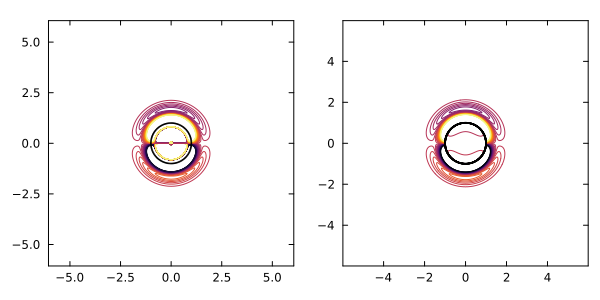

In [ ]:
lim = 0.1
p1 = plot(real(ω2_exact), cache1_exact, levels=range(-lim, lim, length=40), clim=(-lim, lim))
p2 = plot(real(ω2_num), cache1_num, levels=range(-lim, lim, length=40), clim=(-lim, lim))
plot(p1, p2, layout=(1,2), size=(600,300))

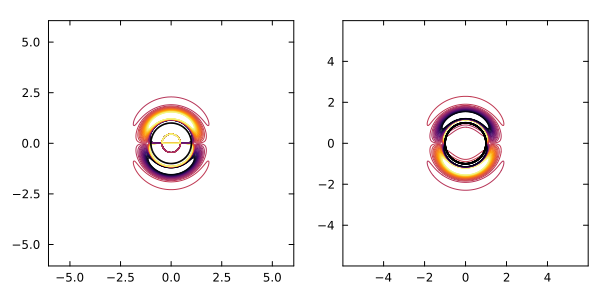

In [ ]:
p1 = plot(imag(ω1_exact), cache1_exact, levels=range(-1, 1, length=40), clim=(-1, 1))
p2 = plot(imag(ω1_num), cache1_num, levels=range(-1, 1, length=40), clim=(-1, 1))
plot(p1, p2, layout=(1,2), size=(600,300))

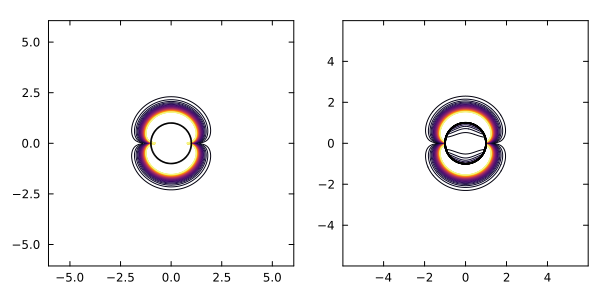

In [ ]:
p1 = plot(abs(ω1_exact), cache1_exact, levels=range(0, 1, length=40), clim=(0, 1))
p2 = plot(abs(ω1_num), cache1_num, levels=range(0, 1, length=40), clim=(0, 1))
plot(p1, p2, layout=(1,2), size=(600,300))

In [ ]:
ω1_exact_interp = interpolatable_field(ω1_exact, cache1_exact)
ω1_num_interp = interpolatable_field(ω1_num, cache1_num);
r_test = 1:0.01:6*sqrt(2)
plot(r_test, real(ω1_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(ω1_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
# ylims!(-0.3, 1.5)

In [ ]:
u1u_num_interp = interpolatable_field(u1_num.u, cache1_num)
u1v_num_interp = interpolatable_field(u1_num.v, cache2_num)
u1u_exact_interp = interpolatable_field(u1_exact.u, cache1_exact)
u1v_exact_interp = interpolatable_field(u1_exact.v, cache2_exact);

In [ ]:
r_test = 0:0.01:6*sqrt(2)
plot(r_test, real(u1u_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(u1u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-1.5, 1.5)

In [ ]:
a1_num = acc1(u1_num, cache1_num, p)
a1_exact = acc1(u1_exact, cache1_exact, p);

In [ ]:
p1 = plot(real(a1_num), cache1_num, levels=range(-0.5, 0.5, length=40), clim=(-0.5, 0.5))
p2 = plot(real(a1_exact), cache1_exact, levels=range(-0.5, 0.5, length=40), clim=(-0.5, 0.5))
plot(p1, p2, layout=(2,1), size=(600,600))

In [359]:
a1_u_num_interp = interpolatable_field(a1_num.u, cache1_num)
a1_u_exact_interp = interpolatable_field(a1_exact.u, cache1_exact);

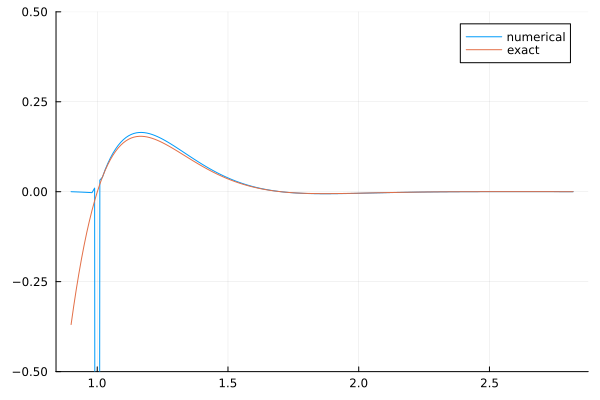

In [360]:
r_test = 0.9:0.01:2*sqrt(2)
plot(r_test, real(a1_u_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(a1_u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-0.5, 0.5)

In [102]:
a2_num = acc2(u1_num, u2_num, cache1_num, cache2_num, p)
a2_exact = acc2(u1_exact, u2_exact, cache1_exact, cache2_exact, p);

In [200]:
a2u_num_interp = interpolatable_field(a2_num.u, cache1_num)
a2u_exact_interp = interpolatable_field(a2_exact.u, cache1_exact);

In [ ]:
r_test = 0.9:0.01:2*sqrt(2)
plot(r_test, real(a2u_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(a2u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-1.5, 0.5)

In [ ]:
p1 = plot(a2_num, cache2_num, levels=range(-0.1, 0.1, length=40), clim=(-0.1, 0.1))
p2 = plot(a2_exact, cache2_exact, levels=range(-0.1, 0.1, length=40), clim=(-0.1, 0.1))
plot(p1, p2, layout=(2,1), size=(600,600))

In [286]:
ls0_num, ls2_num, debug_num = saffman(a1_num, ω1_num; return_debug=true);
ls0_exact, ls2_exact, debug_exact = saffman(a1_exact, ω1_exact; return_debug=true);

In [ ]:
p1 = plot(real(ls0_num), cache1_num, levels=range(-0.1, 0.1, length=40), clim=(-0.1, 0.1))
p2 = plot(real(ls0_exact), cache1_exact, levels=range(-0.1, 0.1, length=40), clim=(-0.1, 0.1))
plot(p1, p2, layout=(2,1), size=(600,600))

In [206]:
ls0_u_exact_interp = interpolatable_field(ls0_exact.u, cache1_exact);
ls0_u_num_interp = interpolatable_field(ls0_num.u, cache1_num);

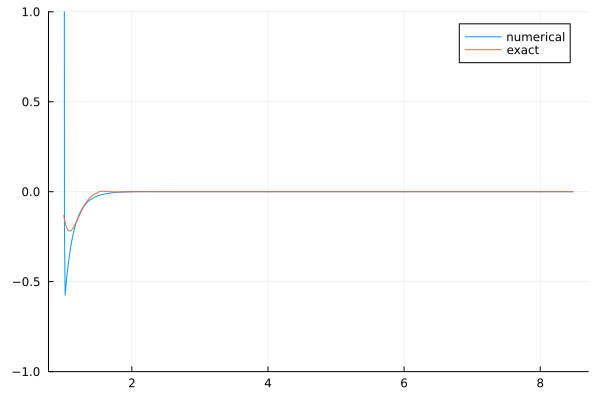

In [213]:
r_test = 1:0.01:6*sqrt(2)
plot(r_test, real(ls0_u_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(ls0_u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-1., 1.)

In [ ]:
a0_num = debug_num.a0
a0_exact = debug_exact.a0;
b0_num = debug_num.b0
b0_exact = debug_exact.b0;
a2_num = debug_num.a2
a2_exact = debug_exact.a2;
b2_num = debug_num.b2
b2_exact = debug_exact.b2;
absω_num = zeros_gridcurl(cache2_num)
absω_exact = zeros_gridcurl(cache2_exact)
absω_num .= debug_num.absω
absω_exact .= debug_exact.absω;

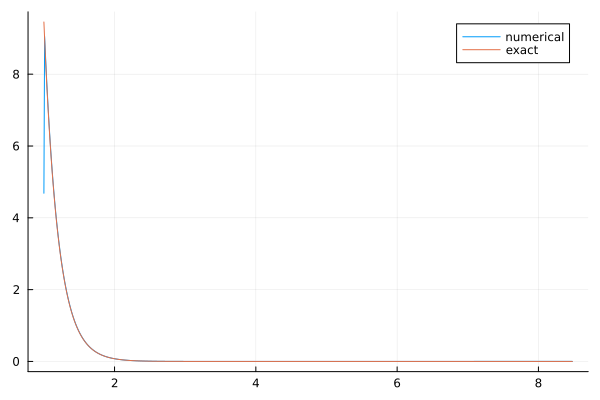

In [324]:
absω_num_interp = interpolatable_field(absω_num, cache1_num)
absω_exact_interp = interpolatable_field(absω_exact, cache1_exact);
r_test = 1:0.01:6*sqrt(2)
plot(r_test, absω_num_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="numerical")
plot!(r_test, absω_exact_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="exact")
# ylims!(-0.01, 0.01)

In [300]:
safe_absω_num = zeros_gridcurl(cache2_num)
safe_absω_exact = zeros_gridcurl(cache2_exact)
safe_absω_num .= debug_num.safe_absω
safe_absω_exact .= debug_exact.safe_absω;

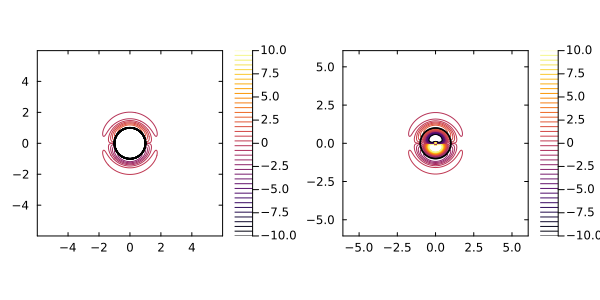

In [368]:
p1 = plot(real(ω1_num) ./sqrt.(absω_num), cache1_num, colorbar = true, levels=range(-10, 10, length=40), clim=(-10, 10))
p2 = plot(real(ω1_exact) ./sqrt.(absω_exact), cache1_exact, colorbar = true, levels=range(-10, 10, length=40), clim=(-10, 10))
plot(p1, p2, layout=(1,2), size=(600,300))

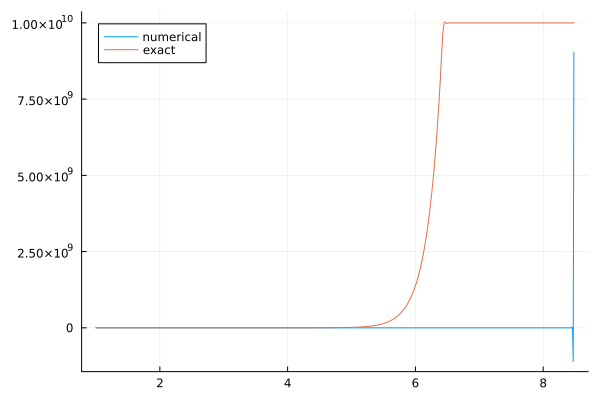

In [307]:
one_over_safe_absω_num_interp = interpolatable_field(1 ./safe_absω_num, cache1_num)
one_over_safe_absω_exact_interp = interpolatable_field(1 ./safe_absω_exact, cache1_exact);
r_test = 1:0.01:6*sqrt(2)
plot(r_test, one_over_safe_absω_num_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="numerical")
plot!(r_test, one_over_safe_absω_exact_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="exact")
# ylims!(0, 10)

In [237]:
a0u_num_interp = interpolatable_field(a0_num.u, cache1_num)
a0u_exact_interp = interpolatable_field(a0_exact.u, cache1_exact);
b0u_num_interp = interpolatable_field(b0_num.u, cache1_num)
b0u_exact_interp = interpolatable_field(b0_exact.u, cache1_exact);

In [ ]:
p1 = plot(real(a0_num), cache1_num, levels=range(-0.5, 0.5, length=40), clim=(-0.5, 0.5))
p2 = plot(real(a0_exact), cache1_exact, levels=range(-0.5, 0.5, length=40), clim=(-0.5, 0.5))
plot(p1, p2, layout=(2,1), size=(600,600))

In [ ]:
p1 = plot(real(b0_num), cache1_num, levels=range(-0.5, 0.5, length=40), clim=(-0.5, 0.5))
p2 = plot(real(b0_exact), cache1_exact, levels=range(-0.5, 0.5, length=40), clim=(-0.5, 0.5))
plot(p1, p2, layout=(2,1), size=(600,600))

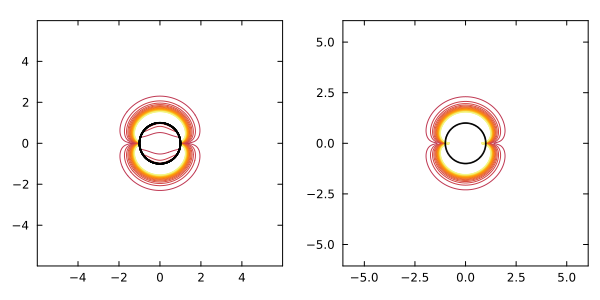

In [289]:
lim = 1
p1 = plot(absω_num, cache1_num, levels=range(-lim, lim, length=40), clim=(-lim, lim))
p2 = plot(absω_exact, cache1_exact, levels=range(-lim, lim, length=40), clim=(-lim, lim))
plot(p1, p2, layout=(1, 2), size=(600, 300))

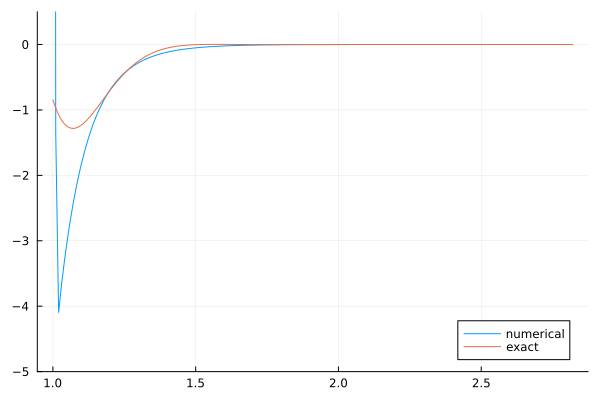

In [ ]:
r_test = 1:0.01:2*sqrt(2)
plot(r_test, real(a0u_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(a0u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-5, 0.5)

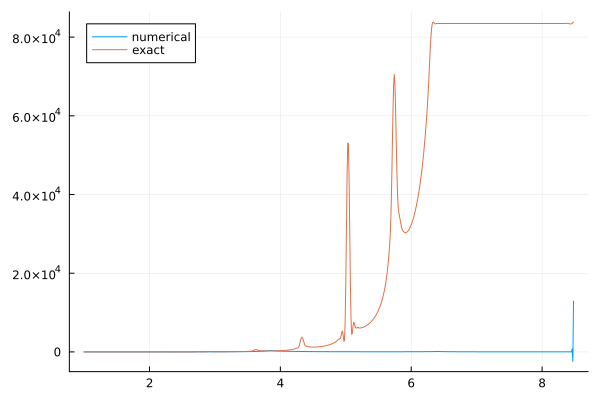

In [240]:
r_test = 1:0.01:6*sqrt(2)
plot(r_test, real(b0u_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(b0u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
# ylims!(-5, 0.5)

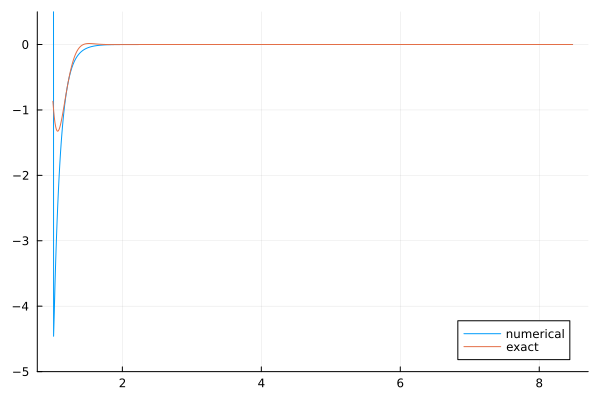

In [315]:
a0_node_u_num = debug_num.a0_node_u
a0_node_u_exact = debug_exact.a0_node_u;
a0_node_u_num_interp = interpolatable_field(a0_node_u_num, cache1_num)
a0_node_u_exact_interp = interpolatable_field(a0_node_u_exact, cache1_exact);
r_test = 1:0.01:6*sqrt(2)
plot(r_test, real(a0_node_u_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(a0_node_u_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-5, 0.5)

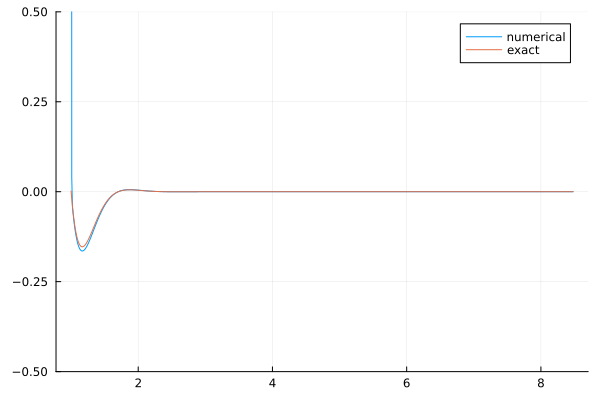

In [370]:
ux_node_num = debug_num.uxnode
ux_node_exact = debug_exact.uxnode;
ux_node_num_interp = interpolatable_field(ux_node_num, cache1_num)
ux_node_exact_interp = interpolatable_field(ux_node_exact, cache1_exact);
r_test = 1:0.01:6*sqrt(2)
plot(r_test, real(ux_node_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(ux_node_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-0.5, 0.5)

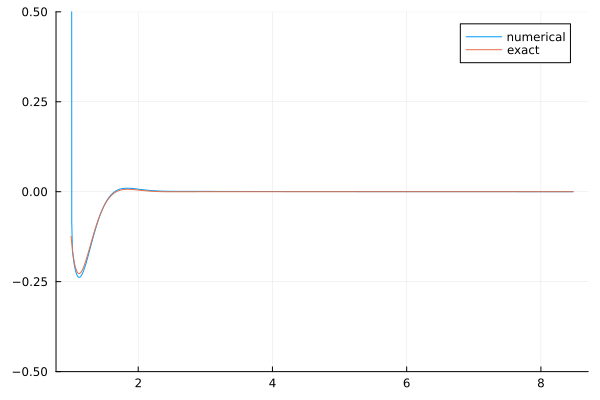

In [369]:
uy_node_num = debug_num.uynode
uy_node_exact = debug_exact.uynode;
uy_node_num_interp = interpolatable_field(uy_node_num, cache1_num)
uy_node_exact_interp = interpolatable_field(uy_node_exact, cache1_exact);
r_test = 1:0.01:6*sqrt(2)
plot(r_test, real(uy_node_num_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="numerical")
plot!(r_test, real(uy_node_exact_interp.(r_test/sqrt(2), r_test/sqrt(2))), label="exact")
ylims!(-0.5, 0.5)

# compute particle trajectories

In [1101]:
# v_L_num = particle_flow.v_L
v_L_noniner = particle_flow_noniner.v_L;
# v_L_exact = particle_flow_exact.v_L;
# v_L_noniner_exact = particle_flow_noniner_exact.v_L;

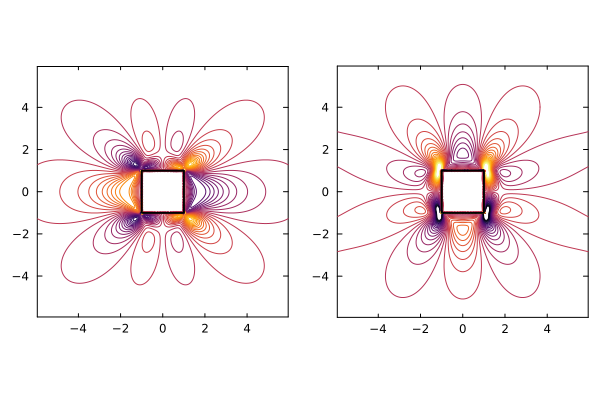

In [1102]:
lim = 0.5
# p1 = plot(real(v_L_num), cache1_num, levels=range(-0.1, 0.1, length=40), clim=(-0.1, 0.1))
p1 = plot(real(v_L_noniner), cache1_num, levels=range(-lim, lim, length=40), clim=(-lim, lim))  
# p1 = plot(real(v_L_exact), cache1_exact, levels=range(-0.1, 0.1, length=40), clim=(-0.1, 0.1))
# p2 = plot(real(v_L_noniner_exact), cache1_exact, levels=range(-lim, lim, length=40), clim=(-lim, lim))
# plot(p1, p2, layout=(2,1), size=(800,600))

In [1103]:
# v_L_u_interp = particle_flow.v_L_u_interp
# v_L_v_interp = particle_flow.v_L_v_interp;
v_L_u_noniner_interp = particle_flow_noniner.v_L_u_interp;
v_L_v_noniner_interp = particle_flow_noniner.v_L_v_interp;
# v_L_u_exact_interp = particle_flow_exact.v_L_u_interp
# v_L_v_exact_interp = particle_flow_exact.v_L_v_interp;
# v_L_u_noniner_exact_interp = particle_flow_noniner_exact.v_L_u_interp
# v_L_v_noniner_exact_interp = particle_flow_noniner_exact.v_L_v_interp;

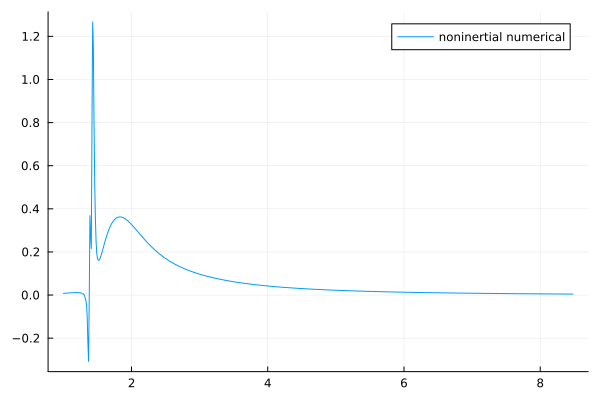

In [1104]:
r_test = 1:0.01:6*sqrt(2)
theta = 45 * pi / 180
# plot(r_test, v_L_u_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="numerical")
plot(r_test, v_L_u_noniner_interp.(r_test/sqrt(2), r_test/sqrt(2)), label="noninertial numerical")
# plot(r_test, v_L_u_exact_interp.(r_test*cos(theta), r_test*sin(theta)), label="exact")
# plot!(r_test, v_L_u_noniner_exact_interp.(r_test*cos(theta), r_test*sin(theta)), label="noninertial exact")

# ylims!(-0.2, 0.1)

In [1105]:
# function particle_dynamics!(du, u, p, t)
#     x, y = u
#     du[1] = v_L_u_interp(x, y)  # dx/dt = u(x, y)
#     du[2] = v_L_v_interp(x, y)  # dy/dt = v(x, y)
# end

function particle_dynamics_noniner!(du, u, p, t)
    x, y = u
    du[1] = v_L_u_noniner_interp(x, y)  # dx/dt = u(x, y)
    du[2] = v_L_v_noniner_interp(x, y)  # dy/dt = v(x, y)
end

# function particle_dynamics_exact!(du, u, p, t)
#     x, y = u
#     du[1] = v_L_u_exact_interp(x, y)  # dx/dt = u(x, y)
#     du[2] = v_L_v_exact_interp(x, y)  # dy/dt = v(x, y)
# end

# function particle_dynamics_noniner_exact!(du, u, p, t)
#     x, y = u
#     du[1] = v_L_u_noniner_exact_interp(x, y)  # dx/dt = u(x, y)
#     du[2] = v_L_v_noniner_exact_interp(x, y)  # dy/dt = v(x, y)
# end

particle_dynamics_noniner! (generic function with 1 method)

In [1323]:
x0, y0 = 4,4# starting position
u0 = [x0, y0]
tspan = (0.0, 4000)  # from t=0 to t=10

(0.0, 4000)

In [1324]:
# prob = ODEProblem(particle_dynamics!, u0, tspan)
# # sol = OrdinaryDiffEq.solve(prob; dt = 2*pi*0.004, adaptive = true);
# sol = OrdinaryDiffEq.solve(prob, Tsit5(), reltol=1e-8, abstol=1e-10);

In [1325]:
prob_noniner = ODEProblem(particle_dynamics_noniner!, u0, tspan)
# sol_noniner = OrdinaryDiffEq.solve(prob_noniner; dt = 2*pi*0.004, adaptive = true);
sol_noniner = OrdinaryDiffEq.solve(prob_noniner, Tsit5(), reltol=1e-8, abstol=1e-10);

In [1326]:
# prob_exact = ODEProblem(particle_dynamics_exact!, u0, tspan)
# sol_exact = OrdinaryDiffEq.solve(prob_exact; dt = 2*pi*0.004, adaptive = false);
# # sol_exact = OrdinaryDiffEq.solve(prob_exact);

In [1327]:
# prob_noniner_exact = ODEProblem(particle_dynamics_noniner_exact!, u0, tspan)
# # sol_noniner_exact = OrdinaryDiffEq.solve(prob_noniner_exact; dt = 2*pi*0.004, adaptive = false);
# sol_noniner_exact = OrdinaryDiffEq.solve(prob_noniner_exact, Tsit5(), reltol=1e-8, abstol=1e-10);

In [1328]:
# x_traj = sol[1, :]
# y_traj = sol[2, :];
x_traj_noniner = sol_noniner[1, :]
y_traj_noniner = sol_noniner[2, :];
# x_traj_exact = sol_exact[1, :]
# y_traj_exact = sol_exact[2, :];
# x_traj_noniner_exact = sol_noniner_exact[1, :]
# y_traj_noniner_exact = sol_noniner_exact[2, :];

In [1330]:
# Lx = 6
# plot(x_traj_exact, y_traj_exact, aspect_ratio = 1, xlims = (0, Lx), ylims = (0, Lx), xlabel = "x", ylabel = "y", label = "Particle Trajectory (Exact)")
# plot!(x_traj_noniner_exact, y_traj_noniner_exact, aspect_ratio = 1, xlims = (0, Lx), ylims = (0, Lx), xlabel = "x", ylabel = "y", label = "Particle Trajectory (Non-Inertial)")

# θ = range(0, 2π, length=200)
# circle_x = cos.(θ)
# circle_y = sin.(θ)
# plot!(circle_x, circle_y, fill = (0, :grey), label = "Cylinder", legend = false)

# savefig("particle_trajectory.png")

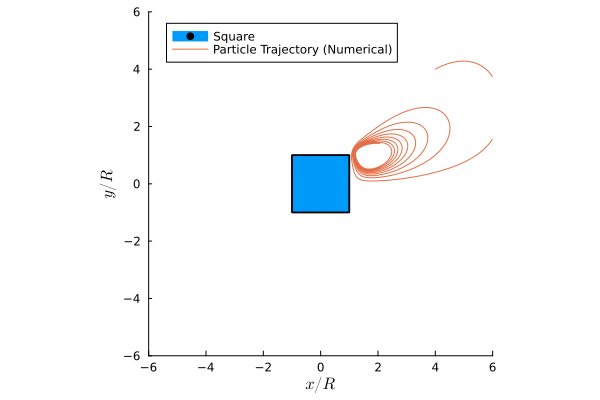

In [1331]:
Lx = 6
idx = 1000
plot(cache1_num, fill=true, legend=true, label="Square", xlabel=L"x/R", ylabel=L"y/R", xlims = (-Lx, Lx), ylims = (-Lx, Lx), aspect_ratio = 1)
# plot!(x_traj, y_traj, aspect_ratio = 1, xlims = (-2, Lx), ylims = (-2, Lx), xlabel = "x", ylabel = "y", label = "Particle Trajectory (Numerical)")
plot!(x_traj_noniner[1:idx], y_traj_noniner[1:idx], label = "Particle Trajectory (Numerical)")
# plot!(x_traj_noniner_exact[1:idx], y_traj_noniner_exact[1:idx], label = "Particle Trajectory (Exact)")
# plot!(x_traj_noniner, y_traj_noniner, aspect_ratio = 1, xlims = (0, Lx), ylims = (0, Lx), xlabel = "x", ylabel = "y", label = "Particle Trajectory (Exact)")
# plot!(x_traj_noniner_exact, y_traj_noniner_exact, label = "Particle Trajectory (Non-Inertial)")
# θ = range(0, 2π, length=200)
# circle_x = cos.(θ)
# circle_y = sin.(θ)
# plot!(circle_x, circle_y, fill = (0, :grey), label = "Cylinder")

# savefig("cylinder_trajectory.pdf")

In [1302]:
x0p1_4 = x_traj_noniner[1:idx]
y0p1_4 = y_traj_noniner[1:idx];
# t_vec = sol_noniner.t[1:idx];

In [1203]:
itp_x = LinearInterpolation(t_vec, x)
itp_y = LinearInterpolation(t_vec, y);

In [1208]:
t_uniform = range(first(t_vec), last(t_vec), length=2000)
x_smooth = itp_x.(t_uniform)
y_smooth = itp_y.(t_uniform);

In [ ]:
n_steps = length(x_smooth)

anim = @animate for t in 1:n_steps
    plot(cache1_num, fill=true, aspect_ratio = 1, xlims = (-2, Lx), ylims = (-2, Lx), xlabel = L"x/R", ylabel = L"y/R")
    # plot!(x_traj_noniner[1:idx], y_traj_noniner[1:idx], color=:red)
    plot!(x_smooth[1:t], y_smooth[1:t],
        lw=2,
        legend=false,
        color=:blue
    )

    # current position (moving dot)
    scatter!([x_smooth[t]], [y_smooth[t]], color=:green)
end

# mp4(anim, "square.mp4", fps=120)

[ Info: Saved animation to /Users/wuqiyuan/julia/ViscousStreaming.jl/notebooks/square.mp4


Plots.AnimatedGif("/Users/wuqiyuan/julia/ViscousStreaming.jl/notebooks/square.mp4")

In [ ]:
plot(cache1_num, aspect_ratio=1, fill=true, legend=false, xlabel=L"x/R", ylabel=L"y/R", xlims = (-2, Lx), ylims = (-2, Lx))
plot!(x33, y33, color=:red)
plot!(x40p1, y40p1, color=:blue)
plot!(x4minus0p1, y4minus0p1, color=:green)
plot!(xminus0p1_4, yminus0p1_4, color=:cyan)
plot!(x0p1_4, y0p1_4, color=:magenta)
# savefig("square_trajs.pdf")

"/Users/wuqiyuan/julia/ViscousStreaming.jl/notebooks/square_trajs.pdf"